In [ ]:
import tensorflow as tf
import numpy as np
import cv2 as cv


import os
import pathlib
import time
import datetime
import glob
import collections

from matplotlib import pyplot as plt
from IPython import display

# to build the model
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate,concatenate
from tensorflow.keras.layers import BatchNormalization, Activation, ZeroPadding2D
from tensorflow.keras.layers import LeakyReLU,ReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D,Conv2DTranspose
from tensorflow.keras import Sequential, Model
from keras.optimizers import Adam

In [ ]:
DATASET_DIR = '/content/drive/MyDrive/data/CUHK_crop/'
TRAIN_DIR = os.path.join(os.path.dirname(DATASET_DIR), 'train/')
TEST_DIR = os.path.join(os.path.dirname(DATASET_DIR), 'test/')
TRAIN_SKETCH = os.path.join(os.path.dirname(TRAIN_DIR), 'sketches/')
TRAIN_PHOTO = os.path.join(os.path.dirname(TRAIN_DIR), 'photos/')
TEST_SKETCH = os.path.join(os.path.dirname(TEST_DIR), 'sketches/')
TEST_PHOTO = os.path.join(os.path.dirname(TEST_DIR), 'photos/')



In [ ]:
# Download the Data

_URL1 = 'http://mmlab.ie.cuhk.edu.hk/archive/sketchdatabase/CUHK/training_88/Cropped_Images/CUHK_training_cropped_sketches.zip'

_URL2 = 'http://mmlab.ie.cuhk.edu.hk/archive/sketchdatabase/CUHK/training_88/Cropped_Images/CUHK_training_cropped_photos.zip'

_URL3 = 'http://mmlab.ie.cuhk.edu.hk/archive/sketchdatabase/CUHK/testing_100/Cropped_Images/CUHK_testing_cropped_sketches.zip'

_URL4 = 'http://mmlab.ie.cuhk.edu.hk/archive/sketchdatabase/CUHK/testing_100/Cropped_Images/CUHK_testing_cropped_photos.zip'


path_to_zip1 = tf.keras.utils.get_file(DATASET_DIR+'/train/CUHK_training_cropped_sketches.zip',
                                      origin=_URL1,archive_format='zip',
                                       cache_subdir=DATASET_DIR+'/train',
                                      extract=True)

path_to_zip2 = tf.keras.utils.get_file(DATASET_DIR+'train/CUHK_training_cropped_photos.zip',
                                      origin=_URL2,archive_format='zip',
                                       cache_subdir=DATASET_DIR+'/train',
                                      extract=True)

path_to_zip3 = tf.keras.utils.get_file(DATASET_DIR+'test/CUHK_testing_cropped_sketches.zip',
                                       cache_subdir=DATASET_DIR+'/test',
                                      origin=_URL3,
                                      extract=True)

path_to_zip4 = tf.keras.utils.get_file(DATASET_DIR+'test/CUHK_testing_cropped_photos.zip',
                                      origin=_URL4,
                                       cache_subdir=DATASET_DIR+'/test',
                                      extract=True)

In [ ]:
TEST_SKETCH

'/content/drive/MyDrive/data/CUHK_crop/test/sketches/'

## Explore Images

In [ ]:
def load(sketch_file, image_file):
    sketch = tf.io.read_file(sketch_file)
    sketch = tf.image.decode_jpeg(sketch, channels=3)

    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)

    sketch = tf.cast(sketch, tf.float32)
    image = tf.cast(image, tf.float32)

    return sketch, image 

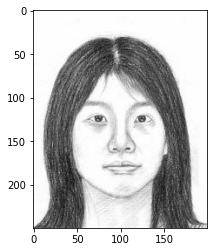

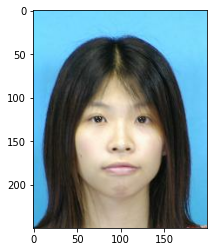

In [ ]:
# see image
ske, img = load(TRAIN_SKETCH+'F2-005-01-sz1.jpg', TRAIN_PHOTO+'f-005-01.jpg')

plt.figure()
plt.imshow(ske/255.0)
plt.figure()
plt.imshow(img/255.0)

In [ ]:
# sketch and image shape
print(ske.shape)
print(img.shape)

(250, 200, 3)
(250, 200, 3)


## Images Preprocessing

As described in the pix2pix paper, you need to apply random jittering and mirroring to preprocess the training set.

In [ ]:
# resize to 256 so we can easily follow the Pix2Pix paper
IMG_WIDTH = 256
IMG_HEIGHT = 256
BUFFER_SIZE = 400
BATCH_SIZE = 1

In [ ]:
def numpyimage(sketch_file, image_file):
    sketch = cv.imread(sketch_file)
    image = cv.imread(image_file)
    color_reverted = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    return sketch, color_reverted

In [ ]:
# resize up so that we can random resize down
def resize(sketch, image, height, width):
    sketch = tf.image.resize(sketch, [height, width], preserve_aspect_ratio=False,method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    image = tf.image.resize(image, [height, width], preserve_aspect_ratio=False, method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return sketch, image

In [ ]:
def random_crop(sketch, image):
    stacked_image = tf.stack([sketch, image], axis=0)
    cropped_image = tf.image.random_crop(stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

    return cropped_image[0], cropped_image[1]

In [ ]:
def random_jitter(sketch, image):
    # resizing to 286 x 236 x 3
    sketch, image = resize(sketch, image, 306, 276)

    # random crop back to 250 x 200
    sketch, image = random_crop(sketch, image)

    if tf.random.uniform(()) > 0.5:
        # random mirroring
        sketch = tf.image.flip_left_right(sketch)
        image = tf.image.flip_left_right(image)

    return sketch, image

In [ ]:
# Normalizing the images to [-1, 1]
def normalize(sketch, image):
    sketch = (sketch / 127.5) - 1
    image = (image / 127.5) - 1

    return sketch, image

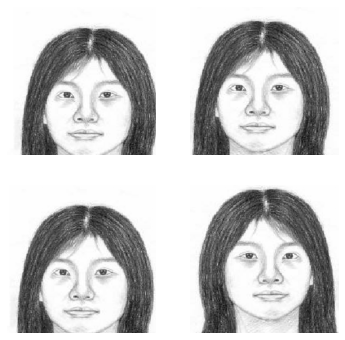

In [ ]:
plt.figure(figsize=(6, 6))
for i in range(4):
    jittered_sketch, jittered_image = random_jitter(ske, img)
    plt.subplot(2, 2, i+1)
    plt.imshow(jittered_sketch/255)
    plt.axis('off')
plt.show()

In [ ]:
jittered_sketch.shape

TensorShape([256, 256, 3])

In the original paper, the dataset was composed of images where the input image and the output image are grouped in 1.

Putting the 2 images side by side as 1 file make it easier when we train since we can leverage the list_files function of tf later. Therefore, we will quickly group the pair of sketch-image together and make 1 jpg file out of it.

Admittedly, this solution is probably not the cleanest way to proceed since we have to add multiple steps to combine the sketch and the image into 1. If you have a better way to proceed, I am more than happy to incorporate your improvement

In [ ]:
train_sketches = sorted(glob.glob(TRAIN_SKETCH+'/*'))
train_photos = sorted(glob.glob(TRAIN_PHOTO+'/*'))

test_sketches = sorted(glob.glob(TEST_SKETCH+'/*'))
test_photos = sorted(glob.glob(TEST_PHOTO+'/*'))

In [ ]:
train=[]
for i in range(0,88):
    train.append(train_sketches[i]+' '+train_photos[i])

test=[]
for i in range(0,100):
    test.append(test_sketches[i]+' '+test_photos[i])


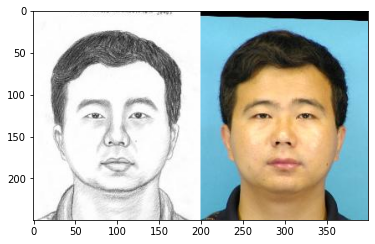

In [ ]:
# merge the sketch and image of the train dataset
j = 0
for i in train:
    im = i.split(' ')
    img0, img1 = numpyimage(im[0], im[1])
    im_v = np.hstack((img0, img1))
    cv.imwrite(TRAIN_DIR+'/concat/'+str(j)+'_merged.jpg', cv.cvtColor(im_v, cv.COLOR_RGB2BGR))

    j += 1

plt.figure()
plt.imshow(im_v)

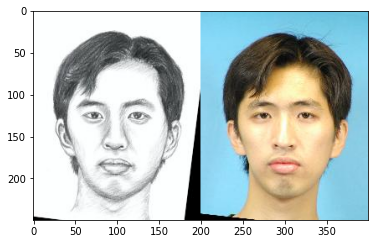

In [ ]:
# merge the sketch and image of the test dataset
j = 0
for i in test:
    im = i.split(' ')
    img0, img1 = numpyimage(im[0], im[1])
    im_v = np.hstack((img0, img1))
    cv.imwrite(TEST_DIR+'/concat/'+str(j)+'_merged.jpg', cv.cvtColor(im_v, cv.COLOR_RGB2BGR))

  j += 1

plt.figure()
plt.imshow(im_v)

## Input Pipeline

In [ ]:
def load2(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)

    w = tf.shape(image)[1]

    w = w // 2
    sketch = image[:, :w, :]
    image = image[:, w:, :]
    sketch = tf.cast(sketch, tf.float32)
    image = tf.cast(image, tf.float32)

    return sketch, image

In [ ]:
def load_image_train(image_file):
    sketch, image = load2(image_file)
    sketch, image = random_jitter(sketch, image)
    sketch, image = normalize(sketch, image)

    return sketch, image

In [ ]:
def load_image_test(image_file):
    sketch, image = load2(image_file)
    sketch, image = resize(sketch, image, IMG_HEIGHT, IMG_WIDTH)
    sketch, image = normalize(sketch, image)

    return sketch, image

In [ ]:
train_dataset = tf.data.Dataset.list_files(TRAIN_DIR+'concat/*.jpg')
train_dataset = train_dataset.map(load_image_train,num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [ ]:
test_dataset = tf.data.Dataset.list_files(TEST_DIR+'concat/*.jpg')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## Build Generator

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = Sequential()
    result.add(Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))
    if apply_batchnorm:
        result.add(BatchNormalization())
        result.add(LeakyReLU())
    return result

In [ ]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))
    result.add(BatchNormalization())
    if apply_dropout:
        result.add(Dropout(0.5))
    result.add(ReLU())
    return result

In [ ]:
def Generator():
    inputs = Input(shape=[256,256,3])
    down_stack = [
        downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4), # (bs, 4, 4, 512)
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]
      up_stack = [
          upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
          upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
          upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
          upsample(512, 4), # (bs, 16, 16, 1024)
          upsample(256, 4), # (bs, 32, 32, 512)
          upsample(128, 4), # (bs, 64, 64, 256)
          upsample(64, 4), # (bs, 128, 128, 128)
      ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(OUTPUT_CHANNELS, 4,
                           strides=2,
                           padding='same',
                           kernel_initializer=initializer,
                           activation='tanh') # (bs, 256, 256, 3)

    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])
    x = last(x)
    return Model(inputs=inputs, outputs=x)

In [ ]:
OUTPUT_CHANNELS = 3

LAMBDA = 100

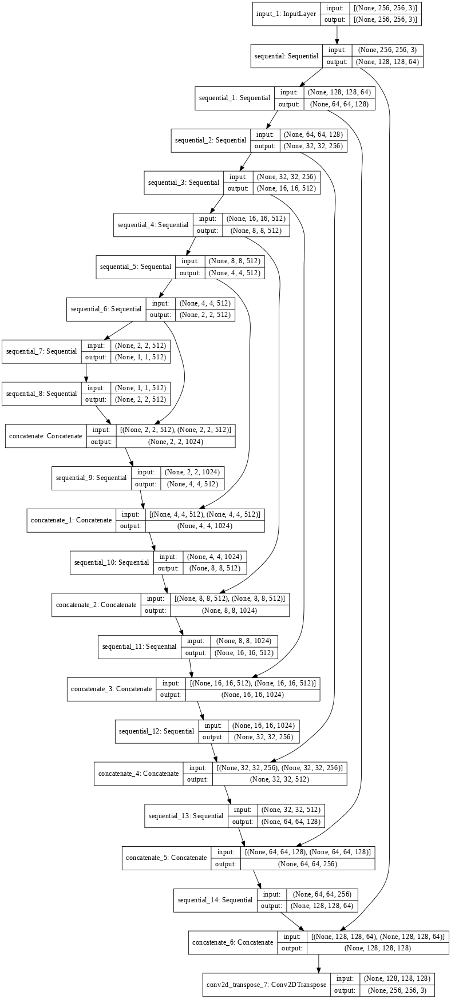

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
# Generator Loss

def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss

## Build Discriminator

In [ ]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

    down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
    down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
    down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                  kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                  kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)

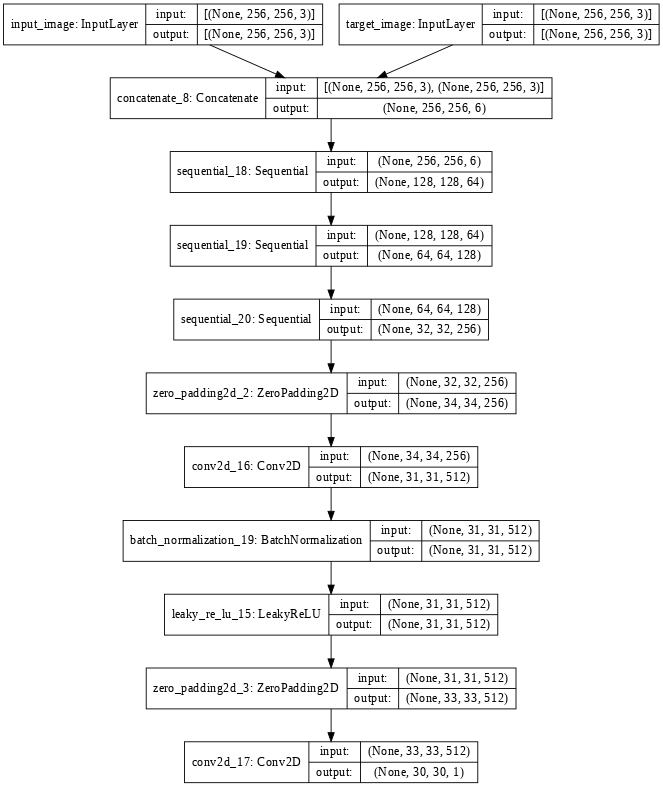

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

In [ ]:
# Discriminator Loss
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

### Optimizer and set up to train

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15, 15))

    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Sketch', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        # Getting the pixel values in the [0, 1] range to plot.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')
    plt.show()

## Generate Images

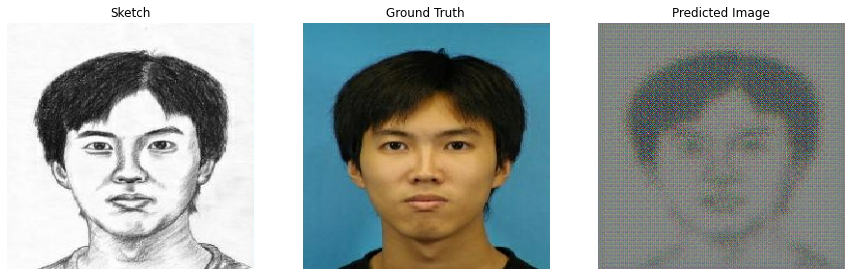

In [ ]:
# testing the function
for example_sketch, example_image in test_dataset.take(1):
    generate_images(generator, example_sketch, example_image)

In [ ]:
log_dir="/content/drive/MyDrive/logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, step):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss,
                                            generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                                 discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                            generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                                discriminator.trainable_variables))

    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
        tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [ ]:
def fit(train_ds, test_ds, steps):
    example_input, example_target = next(iter(test_ds.take(1)))

    for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
        if (step) % 1000 == 0:
            start = time.time()
            display.clear_output(wait=True)

            if step != 0:
                print(f'Time taken for 1000 steps: {time.time()-start} sec\n')

            generate_images(generator, example_input, example_target)
            print(f"Step: {step//1000}k")

        train_step(input_image, target, step)

        # Training step
        if (step+1) % 10 == 0:
            print('.', end='', flush=True)


        # Save (checkpoint) the model every 5k steps
        if (step + 1) % 5000 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

In [ ]:
#docs_infra: no_execute
%load_ext tensorboard
%tensorboard --logdir {log_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

Time taken for 1000 steps: 0.007620334625244141 sec



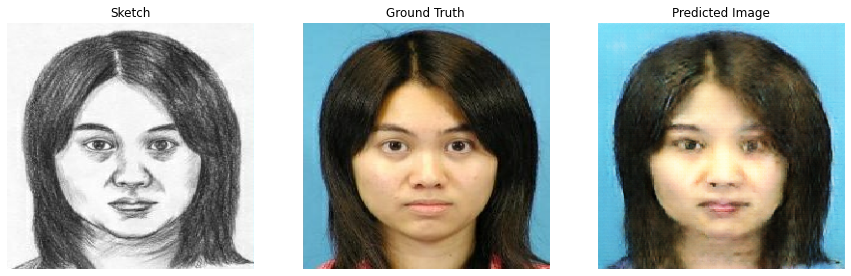

Step: 39k
....................................................................................................

In [ ]:
fit(train_dataset, test_dataset, steps=40000)

In [ ]:
model_dir = '/content/drive/MyDrive/saved_model/sketch_to_suspect'
tf.keras.models.save_model(generator, model_dir)



FOR DEVS: If you are overwriting _tracking_metadata in your class, this property has been used to save metadata in the SavedModel. The metadta field will be deprecated soon, so please move the metadata to a different file.
INFO:tensorflow:Assets written to: /content/drive/MyDrive/saved_model/sketch_to_suspect2/assets


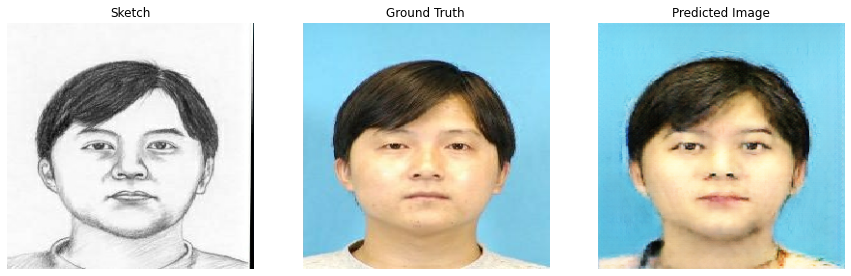

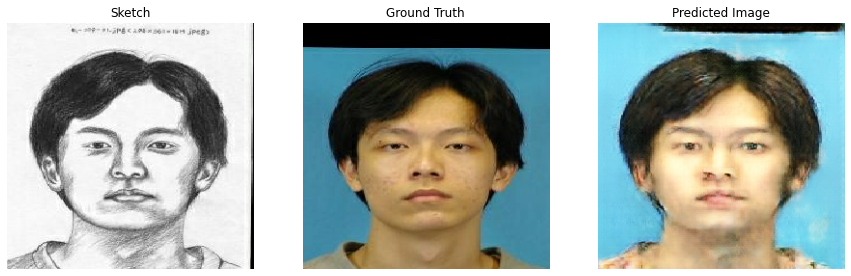

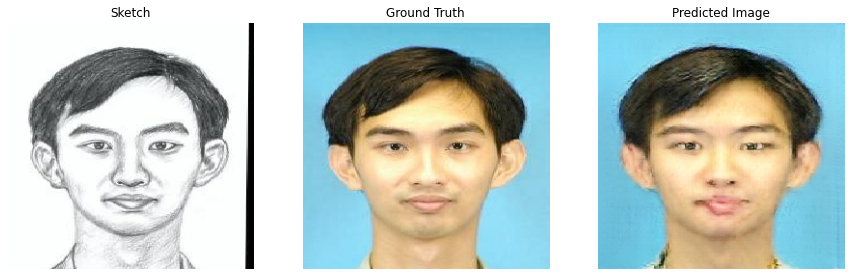

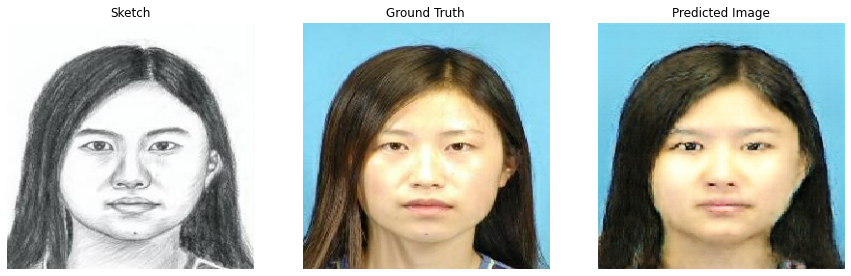

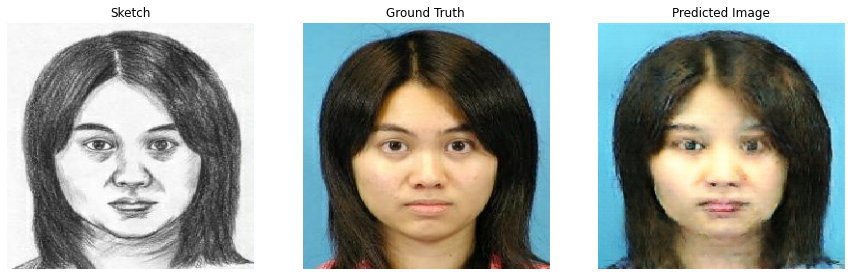

In [ ]:
for ske, img in test_dataset.take(5):
    generate_images(generator, ske, img)

## Conclusion and Improvement points

We have effectively leverage the Pix2Pix Model to map from a sketch to an image with visible similarities to the ground_truth image.

A few drawbacks of our current work:
- First and foremost, the data. Due to lack of freely available data, we have only trained the model on data of Chinese University of Hong Kong (CUHK)'s students. Therefore, there is a lack of  diversity of ethnicity and age group. We could therefore look for more data to improve the model
- All of the sketches are arguable of very similar style. Therefore, with different drawing style, we can imagine that our model will perform much poorer. This relates back to the lack of diversity in the dataset
- Lastly, about the model itself, we could try to replace the U-Net with ResNet model, for potential improvement